<a href="https://colab.research.google.com/github/juiyilin/covid-19-spread/blob/master/wuhan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import pandas as pd

In [2]:
! pip install git+git://github.com/geopandas/geopandas.git
import geopandas as gpd

  Cloning git://github.com/geopandas/geopandas.git to /tmp/pip-req-build-kswpm8se
  Running command git clone -q git://github.com/geopandas/geopandas.git /tmp/pip-req-build-kswpm8se
     |████████████████████████████████| 14.7MB 329kB/s 
     |████████████████████████████████| 10.4MB 17.3MB/s 
  Created wheel for geopandas: filename=geopandas-0.7.0+39.g9b17975-py2.py3-none-any.whl size=941695 sha256=39338dcf9656eb9d563688e2aec359a5f047bf34deb57475a9a87a9f0f65a6a2
  Stored in directory: /tmp/pip-ephem-wheel-cache-2h1d3c66/wheels/91/24/71/376c9c67192694168352afcccc2d264248f7e2cc6192997186
Successfully built geopandas


/usr/local/lib/python3.6/dist-packages/geopandas/sindex.py:26: UserWarning: Spatial indexes require either `rtree` or `pygeos`.
  warn("Spatial indexes require either `rtree` or `pygeos`.")


In [3]:
!apt-get install -qq libgdal-dev libproj-dev
! pip install geoplot
import geoplot

Extracting templates from packages: 100%
(Reading database ... 144568 files and directories currently installed.)
Preparing to unpack .../00-libsqlite3-0_3.22.0-1ubuntu0.3_amd64.deb ...
Unpacking libsqlite3-0:amd64 (3.22.0-1ubuntu0.3) over (3.22.0-1ubuntu0.1) ...
Selecting previously unselected package libmysqlclient-dev.
Preparing to unpack .../01-libmysqlclient-dev_5.7.29-0ubuntu0.18.04.1_amd64.deb ...
Unpacking libmysqlclient-dev (5.7.29-0ubuntu0.18.04.1) ...
Selecting previously unselected package default-libmysqlclient-dev:amd64.
Preparing to unpack .../02-default-libmysqlclient-dev_1.0.4_amd64.deb ...
Unpacking default-libmysqlclient-dev:amd64 (1.0.4) ...
Selecting previously unselected package libblas3:amd64.
Preparing to unpack .../03-libblas3_3.7.1-4ubuntu1_amd64.deb ...
Unpacking libblas3:amd64 (3.7.1-4ubuntu1) ...
Selecting previously unselected package libblas-dev:amd64.
Preparing to unpack .../04-libblas-dev_3.7.1-4ubuntu1_amd64.deb ...
Unpacking libblas-dev:amd64 (3.7.1-4

In [0]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors

In [5]:
!pip install Pillow
from PIL import Image

In [0]:
import glob
import os

###病例

In [7]:
! git clone https://github.com/CSSEGISandData/COVID-19.git

Cloning into 'COVID-19'...
remote: Enumerating objects: 53, done.
remote: Counting objects: 100% (53/53), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 24351 (delta 31), reused 41 (delta 26), pack-reused 24298
Receiving objects: 100% (24351/24351), 108.50 MiB | 32.43 MiB/s, done.
Resolving deltas: 100% (13444/13444), done.


In [0]:
cfm_full_data=pd.read_csv('/content/COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')

In [9]:
cfm_full_data

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
0,NaN,Afghanistan,33.000000,65.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,...,74,84,94,110,110,120,170,174,237,273,281,299,349,367,423,444,484,521,555,607,665,714,784,840,906,933,996,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,123,146,174,186,197,212,223,243,259,277,304,333,361,377,383,400,409,416,433,446,467,475,494,518,539,548,562,584,609,634,663,678,712,726,736,750,766,773,782,789
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,264,302,367,409,454,511,584,716,847,986,1171,1251,1320,1423,1468,1572,1666,1761,1825,1914,1983,2070,2160,2268,2418,2534,2629,2718,2811,2910,3007,3127,3256,3382,3517,3649,3848,4006,4154,4295
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,164,188,224,267,308,334,370,376,390,428,439,466,501,525,545,564,583,601,601,638,646,659,673,673,696,704,713,717,717,723,723,731,738,738,743,743,743,745,745,747
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,3,4,4,5,7,7,7,8,8,8,10,14,16,17,19,19,19,19,19,19,19,19,19,19,24,24,24,24,25,25,25,25,26,27,27,27,27,30,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,4,4,4,4,4,4,4,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6
262,NaN,Sao Tome and Principe,0.186360,6.613081,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,8,8,14,16,16
263,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,6,6,7,10
264,NaN,Comoros,-11.645500,43.333300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,3


In [10]:
cfm_full_data.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,...,74,84,94,110,110,120,170,174,237,273,281,299,349,367,423,444,484,521,555,607,665,714,784,840,906,933,996,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,123,146,174,186,197,212,223,243,259,277,304,333,361,377,383,400,409,416,433,446,467,475,494,518,539,548,562,584,609,634,663,678,712,726,736,750,766,773,782,789
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,264,302,367,409,454,511,584,716,847,986,1171,1251,1320,1423,1468,1572,1666,1761,1825,1914,1983,2070,2160,2268,2418,2534,2629,2718,2811,2910,3007,3127,3256,3382,3517,3649,3848,4006,4154,4295
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,164,188,224,267,308,334,370,376,390,428,439,466,501,525,545,564,583,601,601,638,646,659,673,673,696,704,713,717,717,723,723,731,738,738,743,743,743,745,745,747
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,3,4,4,5,7,7,7,8,8,8,10,14,16,17,19,19,19,19,19,19,19,19,19,19,24,24,24,24,25,25,25,25,26,27,27,27,27,30,35


In [11]:
cfm_full_data.tail()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
261,NaN,Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,4,4,4,4,4,4,4,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6
262,NaN,Sao Tome and Principe,0.186360,6.613081,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,8,8,14,16,16
263,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,6,6,7,10
264,NaN,Comoros,-11.645500,43.333300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,3
265,NaN,Tajikistan,38.861034,71.276093,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,15,15,76


In [0]:
line_plot_data=cfm_full_data.copy()

In [13]:
line_plot_data[line_plot_data['Country/Region']=='Singapore']

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
196,NaN,Singapore,1.2833,103.8333,0,1,3,3,4,5,7,7,10,13,16,18,18,24,28,28,30,33,40,45,47,50,58,67,72,75,77,81,84,84,85,85,89,89,91,93,...,558,631,683,732,802,844,879,926,1000,1049,1114,1189,1309,1375,1481,1623,1910,2108,2299,2532,2918,3252,3699,4427,5050,5992,6588,8014,9125,10141,11178,12075,12693,13624,14423,14951,15641,16169,17101,17548


In [0]:
REPLACE_LIST={
    "Mainland China": "China",
    "Hong Kong": "China",
    "Macau": "China",
    "United States": "United States of America",
    "US": "United States of America",
    "UK": "United Kingdom",
    "Singapore": "Malaysia",
    "Ivory Coast": "Côte d'Ivoire",
    "Bahrain": "Qatar",
    "North Macedonia": "Macedonia",
    "San Marino": "Italy",
    "North Ireland": "United Kingdom",
    "Monaco": "France",
    "Dominican Republic": "Dominican Rep.",
    "Czech Republic": "Czechia",
    "Faroe Islands": "Denmark",
    "Gibraltar": "United Kingdom",
    "Saint Barthelemy": "France",
    "Vatican City": "Italy",
    "Bosnia and Herzegovina":"Bosnia and Herz.",
    "Malta": "Italy",
    "Martinique":"France",
    "Republic of Ireland": "Ireland",
    "Iran (Islamic Republic of)": "Iran",
    "Republic of Korea": "South Korea",
    "Hong Kong SAR": "China",
    "Macao SAR": "China",
    "Viet Nam": "Vietnam",
    "Taipei and environs": "Taiwan",
    "occupied Palestinian territory": "Palestine",
    "Russian Federation": "Russia",
    "Holy See": "Italy",
    "Channel Islands": "United Kingdom",
    "Republic of Moldova": "Moldova",
    "Cote d'Ivoire": "Côte d'Ivoire",
    "Congo (Kinshasa)": "Dem. Rep. Congo",
    "Korea, South": "South Korea",
    "Taiwan*": "Taiwan",
    "Reunion": "France",
    "Guadeloupe": "France",
    "Cayman Islands": "United Kingdom", 
    "Aruba": "Netherlands",
    "Curacao": "Netherlands",
    "Eswatini":"eSwatini",
    "Saint Vincent": "Italy",
    "Equatorial Guinea": "Eq. Guinea",
    "Central African Republic": "Central African Rep.",
    "Congo (Brazzaville)" : "Congo",
    "Republic of the Congo": "Congo",
    "Mayotte": "France",
    "Guam": "United States of America",
    "The Bahamas": "Bahamas",
    "Others": "Diamond Princess",
    "Cruise Ship": "Diamond Princess",
    "The Gambia": "Gambia",
    "Gambia, The": "Gambia",
    "Bahamas, The": "Bahamas",
    "Cabo Verde": "Cape Verde",
    "East Timor": "Timor-Leste",
    "West Bank and Gaza": "Palestine",
    "Burma": "Myanmar",
    "South Sudan": "S. Sudan",
    "Western Sahara": "W. Sahara"
}

# As Singapore is not on the geopanda world map,
# the solution is to transfer Singapore to a nearby country.
cfm_full_data["Country/Region"] = cfm_full_data["Country/Region"].replace(REPLACE_LIST)

In [0]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
boroughs = gpd.read_file(geoplot.datasets.get_path('nyc_boroughs'))
collisions = gpd.read_file(geoplot.datasets.get_path('nyc_injurious_collisions'))

In [16]:
world[world['name']=='Singapore']

,pop_est,continent,name,iso_a3,gdp_md_est,geometry


In [17]:
world.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


In [18]:
world.tail()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
172,7111024,Europe,Serbia,SRB,101800.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,642550,Europe,Montenegro,MNE,10610.0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009..."
174,1895250,Europe,Kosovo,-99,18490.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."
176,13026129,Africa,S. Sudan,SSD,20880.0,"POLYGON ((30.83385 3.50917, 29.95350 4.17370, ..."


In [0]:

# Split French Guiana from France.
shape = world[world['name'] == 'France']['geometry'].all()

# shape[0] is French Guiana in South America
gu_df = gpd.GeoDataFrame({"name": ["French Guiana"],
                          "pop_est":[250109],
                          "continent":["South America"],
                          "gdp_md_est":[52000.0],
                          "iso_a3": -99},
                         geometry=[shape[0]])

world = world.append(gu_df, sort=False, ignore_index=True)

# shape[1,2] is France in Europa
fr_df = gpd.GeoDataFrame(pd.Series(['France', 'France'], name='country'),geometry=[shape[1], shape[2]])
fr_geometry = fr_df.dissolve(by='country')['geometry'].values

world.at[world['name'] == 'France', 'geometry'] = fr_geometry


In [20]:
# For simplicity
HIDDEN = [
    "Diamond Princess", "Antigua and Barbuda", "Saint Lucia", "Jersey",
    "Liechtenstein", "Saint Vincent and the Grenadines", "Guernsey",
    "Maldives", "Andorra", "Seychelles", "Saint Martin", "Barbados",
    "Mauritius", "Cape Verde", "Dominica", "Grenada", "Saint Kitts and Nevis",
    "MS Zaandam","Sao Tome and Principe"]

# Country check
for c in cfm_full_data["Country/Region"].unique():
    if not c in world["name"].values and not c in HIDDEN:
        print(f"Error {c} is not found."
              f" Please edit REPLACE_LIST.")
print("The rest of the country names that have not yet matched:\n",
      set(world.name.unique()) - set(cfm_full_data["Country/Region"].unique()))
world.name.unique()

Error Comoros is not found. Please edit REPLACE_LIST.
The rest of the country names that have not yet matched:
 {'Falkland Is.', 'Puerto Rico', 'Vanuatu', 'Lesotho', 'Fr. S. Antarctic Lands', 'French Guiana', 'Solomon Is.', 'North Korea', 'Greenland', 'N. Cyprus', 'Somaliland', 'Turkmenistan', 'New Caledonia', 'Antarctica'}


array(['Fiji', 'Tanzania', 'W. Sahara', 'Canada',
       'United States of America', 'Kazakhstan', 'Uzbekistan',
       'Papua New Guinea', 'Indonesia', 'Argentina', 'Chile',
       'Dem. Rep. Congo', 'Somalia', 'Kenya', 'Sudan', 'Chad', 'Haiti',
       'Dominican Rep.', 'Russia', 'Bahamas', 'Falkland Is.', 'Norway',
       'Greenland', 'Fr. S. Antarctic Lands', 'Timor-Leste',
       'South Africa', 'Lesotho', 'Mexico', 'Uruguay', 'Brazil',
       'Bolivia', 'Peru', 'Colombia', 'Panama', 'Costa Rica', 'Nicaragua',
       'Honduras', 'El Salvador', 'Guatemala', 'Belize', 'Venezuela',
       'Guyana', 'Suriname', 'France', 'Ecuador', 'Puerto Rico',
       'Jamaica', 'Cuba', 'Zimbabwe', 'Botswana', 'Namibia', 'Senegal',
       'Mali', 'Mauritania', 'Benin', 'Niger', 'Nigeria', 'Cameroon',
       'Togo', 'Ghana', "Côte d'Ivoire", 'Guinea', 'Guinea-Bissau',
       'Liberia', 'Sierra Leone', 'Burkina Faso', 'Central African Rep.',
       'Congo', 'Gabon', 'Eq. Guinea', 'Zambia', 'Malawi', 'M

In [21]:
last_c = cfm_full_data.drop(['Lat','Long'],axis=1).groupby(['Country/Region']).sum()
last_c

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
Country/Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,...,74,84,94,110,110,120,170,174,237,273,281,299,349,367,423,444,484,521,555,607,665,714,784,840,906,933,996,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469
Albania,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,123,146,174,186,197,212,223,243,259,277,304,333,361,377,383,400,409,416,433,446,467,475,494,518,539,548,562,584,609,634,663,678,712,726,736,750,766,773,782,789
Algeria,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,...,264,302,367,409,454,511,584,716,847,986,1171,1251,1320,1423,1468,1572,1666,1761,1825,1914,1983,2070,2160,2268,2418,2534,2629,2718,2811,2910,3007,3127,3256,3382,3517,3649,3848,4006,4154,4295
Andorra,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,164,188,224,267,308,334,370,376,390,428,439,466,501,525,545,564,583,601,601,638,646,659,673,673,696,704,713,717,717,723,723,731,738,738,743,743,743,745,745,747
Angola,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,3,4,4,5,7,7,7,8,8,8,10,14,16,17,19,19,19,19,19,19,19,19,19,19,24,24,24,24,25,25,25,25,26,27,27,27,27,30,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
W. Sahara,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,4,4,4,4,4,4,4,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6
Yemen,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,6,6,7,10
Zambia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,12,16,22,28,29,35,35,36,39,39,39,39,39,39,39,39,40,40,43,45,45,48,48,52,57,61,65,70,74,76,84,84,88,88,95,97,106,109,119


In [22]:
cfm_full_data.columns[-1]

'5/2/20'

In [23]:
last_c.sort_values([cfm_full_data.columns[-1]], ascending=False)

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
Country/Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
United States of America,1,1,2,2,5,5,5,5,5,7,8,8,11,11,11,11,11,11,11,11,12,12,13,13,13,13,13,13,13,13,15,15,15,51,51,57,58,60,68,74,...,53736,65778,83836,101657,121465,140909,161831,188172,213242,243622,275367,308650,336802,366317,397121,428654,462780,496535,526396,555313,580619,607670,636350,667592,699706,732197,758809,784326,811865,840351,869170,905358,938154,965785,988197,1012582,1039909,1069424,1103461,1132539
Spain,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,6,13,15,32,45,84,...,39885,49515,57786,65719,73235,80110,87956,95923,104118,112065,119199,126168,131646,136675,141942,148220,153222,158273,163027,166831,170099,172541,177644,184948,190839,191726,198674,200210,204178,208389,213024,202990,205905,207634,209465,210773,212917,213435,213435,216582
Italy,0,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,3,3,3,3,3,3,3,3,3,3,3,3,3,3,20,62,155,229,322,453,656,889,1129,1695,...,69477,74727,80935,86864,92851,98070,102131,106203,111004,115690,120281,125111,129448,133061,136165,140008,144304,148279,153005,157105,160264,163260,165934,169787,173299,176814,179868,182130,184885,188268,190928,193963,196321,198670,200411,202526,204627,206508,208486,210387
United Kingdom,0,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,3,3,3,8,8,9,9,9,9,9,9,9,9,9,9,9,9,13,13,13,15,20,23,36,...,8164,9640,11812,14745,17312,19780,22453,25481,29865,34173,38689,42477,48436,52279,55949,61474,65872,74605,79874,85206,89570,94845,99483,104145,109769,115314,121172,125856,130172,134638,139246,144640,149569,154037,158348,162350,166441,172481,178685,183500
France,0,0,2,3,3,3,4,5,5,5,6,6,6,6,6,6,6,11,11,11,11,11,11,11,12,12,12,12,12,12,12,12,12,12,14,18,38,57,101,131,...,22645,25631,29584,33444,38147,40754,45219,52879,57804,59989,65266,69566,71485,75420,79242,83138,87450,91828,94955,121805,125487,130458,133678,146168,148178,148180,153105,155487,158262,156074,158397,160046,161738,162314,166058,169148,166638,167394,167400,168613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Mauritania,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2,2,3,3,5,5,5,6,6,6,6,6,6,6,6,6,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,8,8,8,8
Papua New Guinea,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,7,7,7,7,7,7,8,8,8,8,8,8,8,8,8,8,8
Bhutan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2,2,2,3,3,4,4,4,4,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,6,6,7,7,7,7,7,7,7,7,7,7


In [24]:
# Guyana in France uses the same values as in the home country,
# because the latest format has been integrated into France.
last_c = last_c.append(last_c.loc["France"].rename("French Gaiana"))
last_c

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
Country/Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,...,74,84,94,110,110,120,170,174,237,273,281,299,349,367,423,444,484,521,555,607,665,714,784,840,906,933,996,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469
Albania,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,123,146,174,186,197,212,223,243,259,277,304,333,361,377,383,400,409,416,433,446,467,475,494,518,539,548,562,584,609,634,663,678,712,726,736,750,766,773,782,789
Algeria,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,...,264,302,367,409,454,511,584,716,847,986,1171,1251,1320,1423,1468,1572,1666,1761,1825,1914,1983,2070,2160,2268,2418,2534,2629,2718,2811,2910,3007,3127,3256,3382,3517,3649,3848,4006,4154,4295
Andorra,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,164,188,224,267,308,334,370,376,390,428,439,466,501,525,545,564,583,601,601,638,646,659,673,673,696,704,713,717,717,723,723,731,738,738,743,743,743,745,745,747
Angola,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,3,4,4,5,7,7,7,8,8,8,10,14,16,17,19,19,19,19,19,19,19,19,19,19,24,24,24,24,25,25,25,25,26,27,27,27,27,30,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Yemen,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,6,6,7,10
Zambia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,12,16,22,28,29,35,35,36,39,39,39,39,39,39,39,39,40,40,43,45,45,48,48,52,57,61,65,70,74,76,84,84,88,88,95,97,106,109,119
Zimbabwe,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,3,3,5,7,7,7,8,8,9,9,9,9,10,11,11,11,13,14,14,17,17,23,23,24,25,25,25,28,28,28,29,31,31,32,32,32,40,40,34


In [25]:
world=world.drop(['pop_est','gdp_md_est','iso_a3'],axis=1)
world

,continent,name,geometry
0,Oceania,Fiji,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,Africa,Tanzania,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,Africa,W. Sahara,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,North America,Canada,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,North America,United States of America,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."
...,...,...,...
173,Europe,Montenegro,"POLYGON ((20.07070 42.58863, 19.80161 42.50009..."
174,Europe,Kosovo,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,North America,Trinidad and Tobago,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."
176,Africa,S. Sudan,"POLYGON ((30.83385 3.50917, 29.95350 4.17370, ..."


In [26]:
world_corona = pd.merge(world, last_c, left_on='name', right_on='Country/Region', how='left')
world_corona

,continent,name,geometry,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
0,Oceania,Fiji,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,7.0,7.0,12.0,12.0,14.0,15.0,15.0,15.0,16.0,16.0,16.0,16.0,16.0,16.0,17.0,17.0,17.0,17.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0
1,Africa,Tanzania,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,12.0,12.0,13.0,13.0,14.0,14.0,19.0,19.0,20.0,20.0,20.0,20.0,22.0,24.0,24.0,25.0,25.0,32.0,32.0,32.0,49.0,53.0,88.0,94.0,147.0,147.0,170.0,254.0,254.0,284.0,284.0,299.0,299.0,299.0,299.0,299.0,480.0,480.0,480.0,480.0
2,Africa,W. Sahara,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
3,North America,Canada,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,2.0,4.0,4.0,4.0,4.0,4.0,5.0,5.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,8.0,8.0,8.0,8.0,9.0,9.0,9.0,10.0,11.0,11.0,13.0,...,2790.0,3251.0,4042.0,4682.0,5576.0,6280.0,7398.0,8527.0,9560.0,11284.0,12437.0,12978.0,15756.0,16563.0,17872.0,19141.0,20654.0,22059.0,23316.0,24299.0,25680.0,27035.0,28209.0,30809.0,32814.0,34356.0,35633.0,37658.0,39402.0,41663.0,43299.0,44919.0,46371.0,48033.0,49616.0,51150.0,52865.0,54457.0,56343.0,57926.0
4,North America,United States of America,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",1.0,1.0,2.0,2.0,5.0,5.0,5.0,5.0,5.0,7.0,8.0,8.0,11.0,11.0,11.0,11.0,11.0,11.0,11.0,11.0,12.0,12.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,15.0,15.0,15.0,51.0,51.0,57.0,58.0,...,53736.0,65778.0,83836.0,101657.0,121465.0,140909.0,161831.0,188172.0,213242.0,243622.0,275367.0,308650.0,336802.0,366317.0,397121.0,428654.0,462780.0,496535.0,526396.0,555313.0,580619.0,607670.0,636350.0,667592.0,699706.0,732197.0,758809.0,784326.0,811865.0,840351.0,869170.0,905358.0,938154.0,965785.0,988197.0,1012582.0,1039909.0,1069424.0,1103461.0,1132539.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,Europe,Montenegro,"POLYGON ((20.07070 42.58863, 19.80161 42.50009...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,47.0,52.0,69.0,82.0,84.0,85.0,91.0,109.0,123.0,144.0,174.0,201.0,214.0,233.0,241.0,248.0,252.0,255.0,263.0,272.0,274.0,283.0,288.0,303.0,303.0,307.0,308.0,312.0,313.0,315.0,316.0,319.0,320.0,321.0,321.0,321.0,322.0,322.0,322.0,322.0
174,Europe,Kosovo,"POLYGON ((20.59025 41.85541, 20.52295 42.21787...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [0]:
world_corona.insert(2,'before 1/22/20',0)

In [0]:
world_corona=world_corona.fillna(0)

In [29]:
world_corona.tail()

,continent,name,before 1/22/20,geometry,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
173,Europe,Montenegro,0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,47.0,52.0,69.0,82.0,84.0,85.0,91.0,109.0,123.0,144.0,174.0,201.0,214.0,233.0,241.0,248.0,252.0,255.0,263.0,272.0,274.0,283.0,288.0,303.0,303.0,307.0,308.0,312.0,313.0,315.0,316.0,319.0,320.0,321.0,321.0,321.0,322.0,322.0,322.0,322.0
174,Europe,Kosovo,0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,71.0,86.0,91.0,94.0,94.0,112.0,125.0,125.0,126.0,135.0,145.0,145.0,170.0,184.0,184.0,250.0,283.0,283.0,283.0,387.0,387.0,449.0,480.0,510.0,561.0,598.0,604.0,630.0,669.0,703.0,731.0,763.0,780.0,790.0,799.0,806.0,806.0,823.0
175,North America,Trinidad and Tobago,0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,57.0,60.0,65.0,66.0,74.0,78.0,82.0,87.0,90.0,94.0,98.0,103.0,104.0,105.0,107.0,107.0,109.0,109.0,112.0,113.0,113.0,113.0,114.0,114.0,114.0,114.0,114.0,114.0,115.0,115.0,115.0,115.0,115.0,115.0,116.0,116.0,116.0,116.0,116.0,116.0
176,Africa,S. Sudan,0,"POLYGON ((30.83385 3.50917, 29.95350 4.17370, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,5.0,5.0,5.0,6.0,6.0,34.0,34.0,35.0,45.0,45.0
177,South America,French Guiana,0,"POLYGON ((-51.65780 4.15623, -52.24934 3.24109...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [30]:
world_corona[world_corona['1/22/20']>0]

,continent,name,before 1/22/20,geometry,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
4,North America,United States of America,0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",1.0,1.0,2.0,2.0,5.0,5.0,5.0,5.0,5.0,7.0,8.0,8.0,11.0,11.0,11.0,11.0,11.0,11.0,11.0,11.0,12.0,12.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,15.0,15.0,15.0,51.0,51.0,57.0,...,53736.0,65778.0,83836.0,101657.0,121465.0,140909.0,161831.0,188172.0,213242.0,243622.0,275367.0,308650.0,336802.0,366317.0,397121.0,428654.0,462780.0,496535.0,526396.0,555313.0,580619.0,607670.0,636350.0,667592.0,699706.0,732197.0,758809.0,784326.0,811865.0,840351.0,869170.0,905358.0,938154.0,965785.0,988197.0,1012582.0,1039909.0,1069424.0,1103461.0,1132539.0
91,Asia,Thailand,0,"POLYGON ((105.21878 14.27321, 104.28142 14.416...",2.0,3.0,5.0,7.0,8.0,8.0,14.0,14.0,14.0,19.0,19.0,19.0,19.0,25.0,25.0,25.0,25.0,32.0,32.0,32.0,33.0,33.0,33.0,33.0,33.0,34.0,35.0,35.0,35.0,35.0,35.0,35.0,35.0,35.0,37.0,40.0,...,827.0,934.0,1045.0,1136.0,1245.0,1388.0,1524.0,1651.0,1771.0,1875.0,1978.0,2067.0,2169.0,2220.0,2258.0,2369.0,2423.0,2473.0,2518.0,2551.0,2579.0,2613.0,2643.0,2672.0,2700.0,2733.0,2765.0,2792.0,2811.0,2826.0,2839.0,2907.0,2907.0,2922.0,2931.0,2938.0,2947.0,2954.0,2960.0,2966.0
96,Asia,South Korea,0,"POLYGON ((126.17476 37.74969, 126.23734 37.840...",1.0,1.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,11.0,12.0,15.0,15.0,16.0,19.0,23.0,24.0,24.0,25.0,27.0,28.0,28.0,28.0,28.0,28.0,29.0,30.0,31.0,31.0,104.0,204.0,433.0,602.0,833.0,977.0,1261.0,...,9037.0,9137.0,9241.0,9332.0,9478.0,9583.0,9661.0,9786.0,9887.0,9976.0,10062.0,10156.0,10237.0,10284.0,10331.0,10384.0,10423.0,10450.0,10480.0,10512.0,10537.0,10564.0,10591.0,10613.0,10635.0,10653.0,10661.0,10674.0,10683.0,10694.0,10708.0,10718.0,10728.0,10738.0,10752.0,10761.0,10765.0,10774.0,10780.0,10793.0
139,Asia,China,0,"MULTIPOLYGON (((109.47521 18.19770, 108.65521 ...",548.0,643.0,920.0,1406.0,2075.0,2877.0,5509.0,6087.0,8141.0,9802.0,11891.0,16630.0,19716.0,23707.0,27440.0,30587.0,34110.0,36814.0,39829.0,42354.0,44386.0,44759.0,59895.0,66358.0,68413.0,70513.0,72434.0,74211.0,74619.0,75077.0,75550.0,77001.0,77022.0,77241.0,77754.0,78166.0,...,81591.0,81661.0,81782.0,81897.0,81999.0,82122.0,82198.0,82279.0,82361.0,82432.0,82511.0,82543.0,82602.0,82665.0,82718.0,82809.0,82883.0,82941.0,83014.0,83134.0,83213.0,83306.0,83356.0,83403.0,83760.0,83787.0,83805.0,83817.0,83853.0,83868.0,83884.0,83899.0,83909.0,83912.0,83918.0,83940.0,83944.0,83956.0,83959.0,83959.0
140,Asia,Taiwan,0,"POLYGON ((121.77782 24.39427, 121.17563 22.790...",1.0,1.0,3.0,3.0,4.0,5.0,8.0,8.0,9.0,10.0,10.0,10.0,10.0,11.0,11.0,16.0,16.0,17.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,20.0,22.0,22.0,23.0,24.0,26.0,26.0,28.0,30.0,31.0,32.0,...,215.0,235.0,252.0,267.0,283.0,298.0,306.0,322.0,329.0,339.0,348.0,355.0,363.0,373.0,376.0,379.0,380.0,382.0,385.0,388.0,393.0,393.0,395.0,395.0,395.0,398.0,420.0,422.0,425.0,426.0,427.0,428.0,429.0,429.0,429.0,429.0,429.0,429.0,429.0,432.0
155,Asia,Japan,0,"MULTIPOLYGON (((141.88460 39.18086, 140.95949 ...",2.0,2.0,2.0,2.0,4.0,4.0,7.0,7.0,11.0,15.0,20.0,20.0,20.0,22.0,22.0,22.0,25.0,25.0,26.0,26.0,26.0,28.0,28.0,29.0,43.0,59.0,66.0,74.0,84.0,94.0,105.0,122.0,147.0,159.0,170.0,189.0,...,1193.0,1307.0,1387.0,1468.0,1693.0,1866.0,1866.0,1953.0,2178.0,2495.0,2617.0,3139.0,3139.0,3654.0,3906.0,4257.0,4667.0,5530.0,6005.0,6748.0,7370.0,7645.0,8100.0,8626.0,9787.0,10296.0,10797.0,10797.0,11135.0,11512.0,12368.0,12829.0,13231.0,13

#擴散

before 1/22/20 finish save
1/22/20 finish save
1/23/20 finish save
1/24/20 finish save
1/25/20 finish save
1/26/20 finish save
1/27/20 finish save
1/28/20 finish save
1/29/20 finish save
1/30/20 finish save
1/31/20 finish save
2/1/20 finish save
2/2/20 finish save
2/3/20 finish save
2/4/20 finish save
2/5/20 finish save
2/6/20 finish save
2/7/20 finish save
2/8/20 finish save
2/9/20 finish save


/usr/local/lib/python3.6/dist-packages/geoplot/geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


2/10/20 finish save
2/11/20 finish save
2/12/20 finish save
2/13/20 finish save
2/14/20 finish save
2/15/20 finish save
2/16/20 finish save
2/17/20 finish save
2/18/20 finish save
2/19/20 finish save
2/20/20 finish save
2/21/20 finish save
2/22/20 finish save
2/23/20 finish save
2/24/20 finish save
2/25/20 finish save
2/26/20 finish save
2/27/20 finish save
2/28/20 finish save
2/29/20 finish save
3/1/20 finish save
3/2/20 finish save
3/3/20 finish save
3/4/20 finish save
3/5/20 finish save
3/6/20 finish save
3/7/20 finish save
3/8/20 finish save
3/9/20 finish save
3/10/20 finish save
3/11/20 finish save
3/12/20 finish save
3/13/20 finish save
3/14/20 finish save
3/15/20 finish save
3/16/20 finish save
3/17/20 finish save
3/18/20 finish save
3/19/20 finish save
3/20/20 finish save
3/21/20 finish save
3/22/20 finish save
3/23/20 finish save
3/24/20 finish save
3/25/20 finish save
3/26/20 finish save
3/27/20 finish save
3/28/20 finish save
3/29/20 finish save
3/30/20 finish save
3/31/20 f

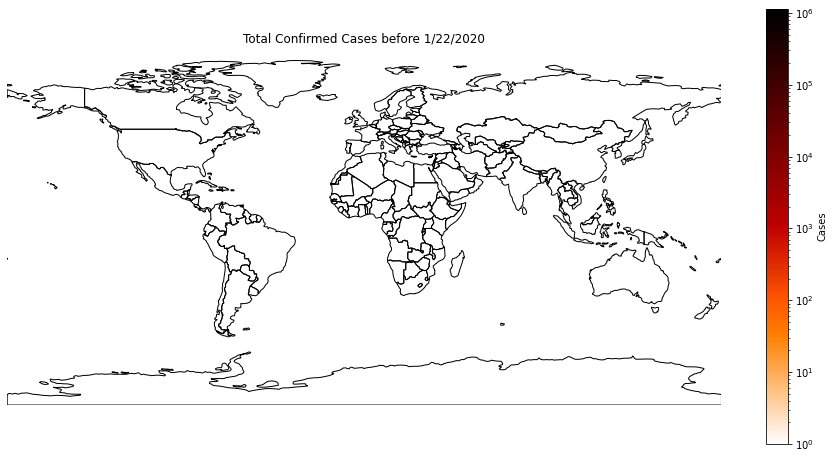

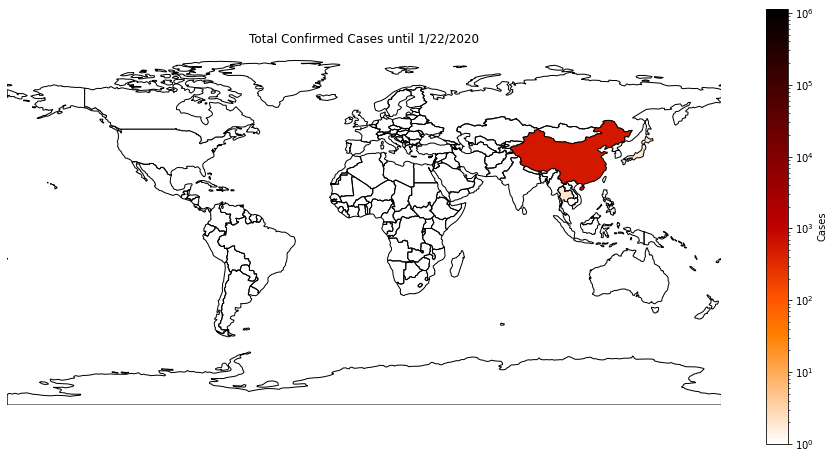

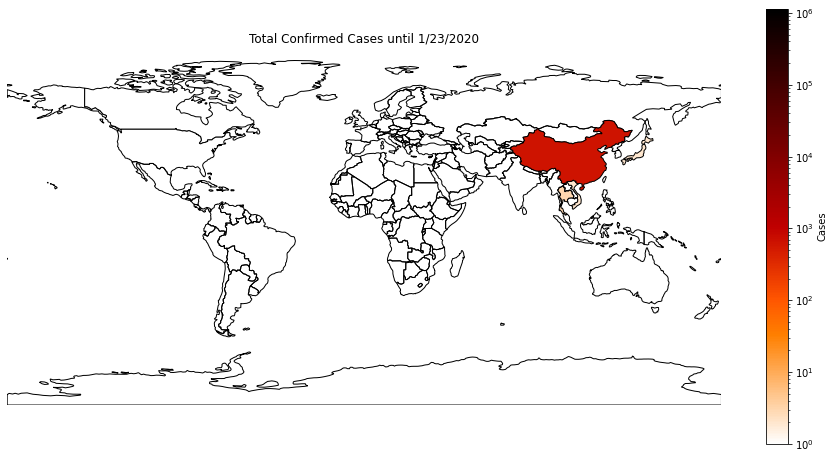

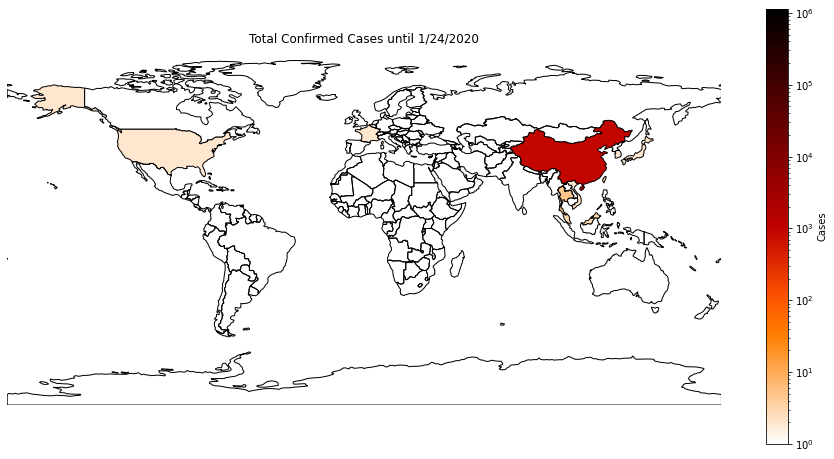

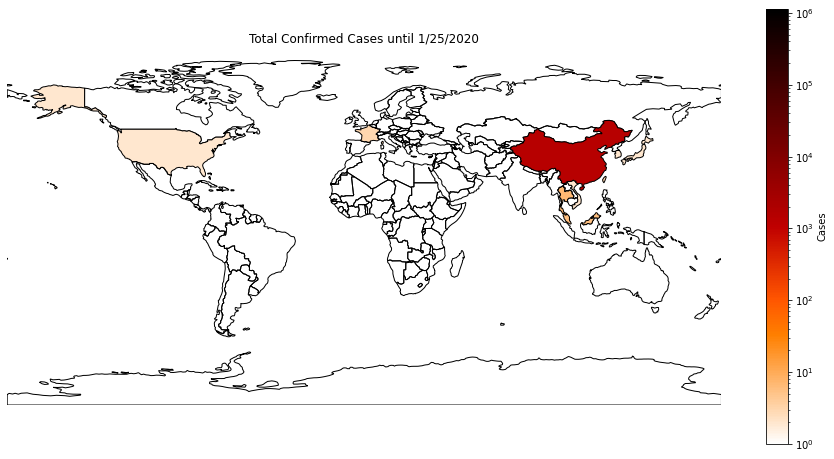

...

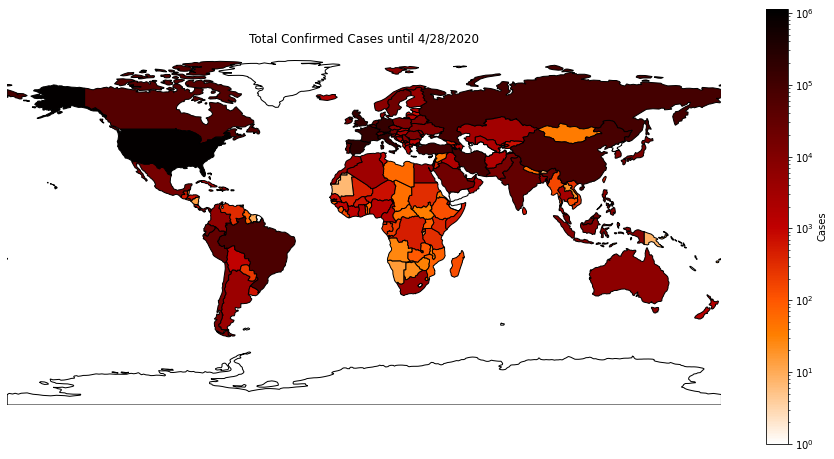

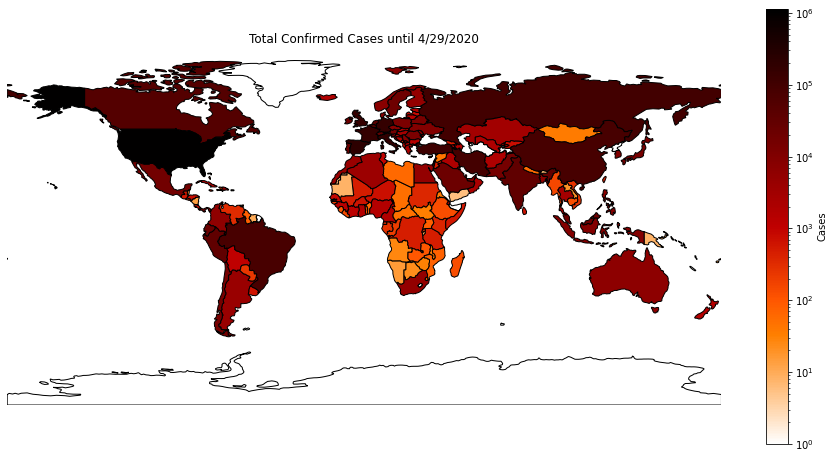

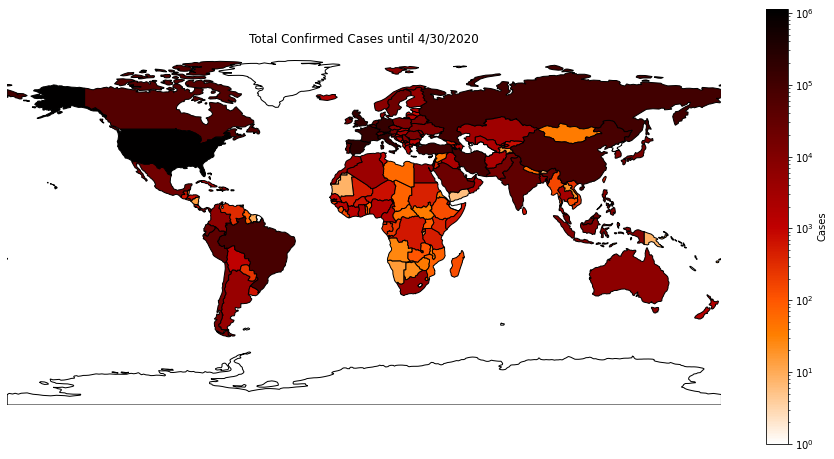

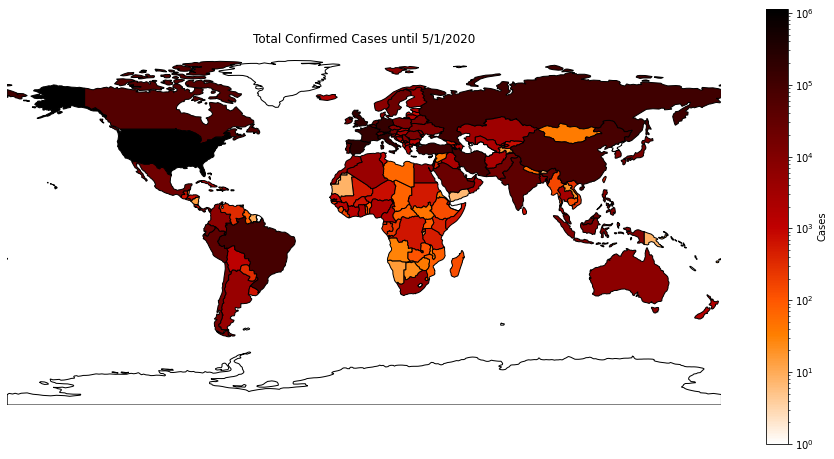

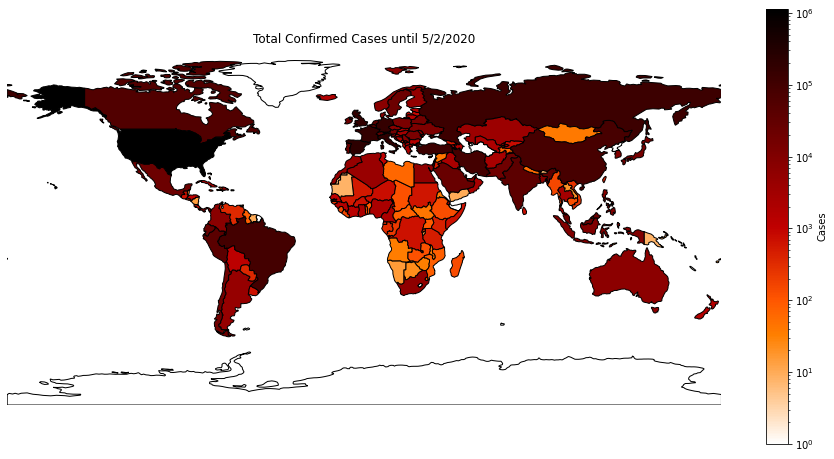

In [31]:
for date in world_corona.columns:
    if not date.isalpha():
        
        norm=colors.LogNorm(vmin=1, vmax=world_corona[world_corona.columns[-1]].max())
        #plot
        geoplot.choropleth(
            world_corona, hue=world_corona[date],
            cmap='gist_heat_r', 
            figsize=(16, 8),
            norm = norm
        )
        if date=='before 1/22/20':
            plt.title('Total Confirmed Cases {}20'.format(date))
        else:
            plt.title('Total Confirmed Cases until {}20'.format(date))

        #colorbar
        cmap = mpl.cm.gist_heat_r
        plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
                    label='Cases')
        #save
        figname=date.replace('/','-')
        plt.savefig(figname+'20.png')
        print(date, 'finish save')

In [32]:
imglist=[]
imglist = glob.glob("*.png")
imglist.sort(key=os.path.getmtime)
imglist

['before 1-22-2020.png',
 '1-22-2020.png',
 '1-23-2020.png',
 '1-24-2020.png',
 '1-25-2020.png',
 '1-26-2020.png',
 '1-27-2020.png',
 '1-28-2020.png',
 '1-29-2020.png',
 '1-30-2020.png',
 '1-31-2020.png',
 '2-1-2020.png',
 '2-2-2020.png',
 '2-3-2020.png',
 '2-4-2020.png',
 '2-5-2020.png',
 '2-6-2020.png',
 '2-7-2020.png',
 '2-8-2020.png',
 '2-9-2020.png',
 '2-10-2020.png',
 '2-11-2020.png',
 '2-12-2020.png',
 '2-13-2020.png',
 '2-14-2020.png',
 '2-15-2020.png',
 '2-16-2020.png',
 '2-17-2020.png',
 '2-18-2020.png',
 '2-19-2020.png',
 '2-20-2020.png',
 '2-21-2020.png',
 '2-22-2020.png',
 '2-23-2020.png',
 '2-24-2020.png',
 '2-25-2020.png',
 '2-26-2020.png',
 '2-27-2020.png',
 '2-28-2020.png',
 '2-29-2020.png',
 '3-1-2020.png',
 '3-2-2020.png',
 '3-3-2020.png',
 '3-4-2020.png',
 '3-5-2020.png',
 '3-6-2020.png',
 '3-7-2020.png',
 '3-8-2020.png',
 '3-9-2020.png',
 '3-10-2020.png',
 '3-11-2020.png',
 '3-12-2020.png',
 '3-13-2020.png',
 '3-14-2020.png',
 '3-15-2020.png',
 '3-16-2020.png',
 '3

In [0]:
giflist=[]
for imgs in imglist:
    img=Image.open(imgs)
    giflist.append(img)
giflist[0].save('covid19_slow.gif',save_all=True,append_images=giflist[:],loop=0,duration=500)
giflist[0].save('covid19_fast.gif',save_all=True,append_images=giflist[:],loop=0)
#im.save(out, save_all=True, append_images=[im1, im2, ...])

https://www.kaggle.com/hotstaff/covid-19-cases-global-map-use-github/notebook

#趨勢

In [34]:
line_plot_data.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,...,74,84,94,110,110,120,170,174,237,273,281,299,349,367,423,444,484,521,555,607,665,714,784,840,906,933,996,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,123,146,174,186,197,212,223,243,259,277,304,333,361,377,383,400,409,416,433,446,467,475,494,518,539,548,562,584,609,634,663,678,712,726,736,750,766,773,782,789
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,264,302,367,409,454,511,584,716,847,986,1171,1251,1320,1423,1468,1572,1666,1761,1825,1914,1983,2070,2160,2268,2418,2534,2629,2718,2811,2910,3007,3127,3256,3382,3517,3649,3848,4006,4154,4295
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,164,188,224,267,308,334,370,376,390,428,439,466,501,525,545,564,583,601,601,638,646,659,673,673,696,704,713,717,717,723,723,731,738,738,743,743,743,745,745,747
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,3,4,4,5,7,7,7,8,8,8,10,14,16,17,19,19,19,19,19,19,19,19,19,19,24,24,24,24,25,25,25,25,26,27,27,27,27,30,35


In [35]:
line_plot_data=line_plot_data.drop(['Province/State','Lat','Long'],axis=1).groupby(['Country/Region']).sum()
#topten=topten.sort_values([line_plot_data.columns[-1]],ascending=False).head(10).reset_index()
line_plot_data

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,...,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20
Country/Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,...,74,84,94,110,110,120,170,174,237,273,281,299,349,367,423,444,484,521,555,607,665,714,784,840,906,933,996,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469
Albania,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,123,146,174,186,197,212,223,243,259,277,304,333,361,377,383,400,409,416,433,446,467,475,494,518,539,548,562,584,609,634,663,678,712,726,736,750,766,773,782,789
Algeria,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,...,264,302,367,409,454,511,584,716,847,986,1171,1251,1320,1423,1468,1572,1666,1761,1825,1914,1983,2070,2160,2268,2418,2534,2629,2718,2811,2910,3007,3127,3256,3382,3517,3649,3848,4006,4154,4295
Andorra,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,164,188,224,267,308,334,370,376,390,428,439,466,501,525,545,564,583,601,601,638,646,659,673,673,696,704,713,717,717,723,723,731,738,738,743,743,743,745,745,747
Angola,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,3,4,4,5,7,7,7,8,8,8,10,14,16,17,19,19,19,19,19,19,19,19,19,19,24,24,24,24,25,25,25,25,26,27,27,27,27,30,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
West Bank and Gaza,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,59,59,84,91,98,109,116,119,134,161,194,217,237,254,261,263,263,267,268,290,308,308,374,374,402,418,437,449,466,474,480,484,342,342,342,343,344,344,353,353
Western Sahara,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,4,4,4,4,4,4,4,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6
Yemen,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,6,6,7,10


In [36]:
continenttopten=line_plot_data.drop(['Province/State','Lat','Long'],axis=1).groupby(['Country/Region']).sum()
continenttopten.head()

KeyError: ignored

In [0]:
topten=pd.merge(world, line_plot_data, left_on='name', right_on='Country/Region', how='left').fillna(0)
topten

In [0]:
topten[topten['continent']=='Asia'].drop('geometry',axis=1)

In [0]:
mpl.rcParams['figure.figsize'] = (20, 8)


country=['South Korea', 'Japan','Taiwan','Malaysia','Philippines','India','Thailand','Vietnam']
for i in country:
    plt.plot(continent.columns[2:],continent.loc[int(continent[continent['name']==i].index.values),'1/22/20':],marker='.')
plt.legend(country)
plt.xticks(rotation=60,)


In [0]:
mpl.rcParams['figure.figsize'] = (20, 8)
for c in line_plot_data['continent'].unique():
    if c=='Europe':
        continent=line_plot_data[line_plot_data['continent']==c].drop('geometry',axis=1).sort_values(line_plot_data.columns[-1],ascending=False)
        
        for i in range(10):
            plt.plot(continent.columns[2:],continent.iloc[i,2:],marker='.')
        
        plt.legend(continent['name'])
        plt.xticks(rotation=60)


In [0]:
continent=line_plot_data[line_plot_data['continent']=='Europe'].drop('geometry',axis=1).sort_values(line_plot_data.columns[-1],ascending=False)
continent.head()